<a href="https://colab.research.google.com/github/pmckim1/Capstone/blob/main/Death_of_castro_case_study.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# install packages for googl colab 
!pip install chart_studio
!pip install fuzzywuzzy


!pip uninstall -y plotly
!pip install plotly>=4.9
import plotly
import plotly.graph_objects as go
!pip freeze

Uninstalling plotly-4.14.3:
  Successfully uninstalled plotly-4.14.3
absl-py==0.12.0
alabaster==0.7.12
albumentations==0.1.12
altair==4.1.0
appdirs==1.4.4
argon2-cffi==20.1.0
astor==0.8.1
astropy==4.2.1
astunparse==1.6.3
async-generator==1.10
atari-py==0.2.6
atomicwrites==1.4.0
attrs==20.3.0
audioread==2.1.9
autograd==1.3
Babel==2.9.0
backcall==0.2.0
beautifulsoup4==4.6.3
bleach==3.3.0
blis==0.4.1
bokeh==2.3.1
Bottleneck==1.3.2
branca==0.4.2
bs4==0.0.1
CacheControl==0.12.6
cachetools==4.2.1
catalogue==1.0.0
certifi==2020.12.5
cffi==1.14.5
chainer==7.4.0
chardet==3.0.4
chart-studio==1.1.0
click==7.1.2
cloudpickle==1.3.0
cmake==3.12.0
cmdstanpy==0.9.5
colorcet==2.0.6
colorlover==0.3.0
community==1.0.0b1
contextlib2==0.5.5
convertdate==2.3.2
coverage==3.7.1
coveralls==0.5
crcmod==1.7
cufflinks==0.17.3
cvxopt==1.2.6
cvxpy==1.0.31
cycler==0.10.0
cymem==2.0.5
Cython==0.29.22
daft==0.0.4
dask==2.12.0
datascience==0.10.6
debugpy==1.0.0
decorator==4.4.2
defusedxml==0.7.1
descartes==1.1.0
dill==

In [ ]:
# use high-ram to speed up processing on collab 
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 13.7 gigabytes of available RAM

To enable a high-RAM runtime, select the Runtime > "Change runtime type"
menu, and then select High-RAM in the Runtime shape dropdown. Then, 
re-execute this cell.


In [ ]:
import numpy as np
np.random.seed(42)
from google.colab import drive
import json 
import sys
import pandas as pd
import datetime as dt
import warnings
import matplotlib
import networkx as nx
import matplotlib.pyplot as plt
import string
import chart_studio
import chart_studio.plotly as py
import chart_studio.tools as tls
import plotly.express as px
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
# Mount Google Drive
drive.mount('/content/drive')

# plotly chart
user_name="mckimpc"
apikey="IqaqsGCZx3v4e0WhTNfT"

chart_studio.tools.set_credentials_file(username=user_name, api_key=apikey)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:

# Get the absolute path of the current folder
abspath_curr = '/content/drive/My Drive/capstone/capstone/Data/Guardian/'

# load in all the file output from event extraction algo 

df = pd.read_csv(abspath_curr +'stream-topped-2.csv', header=0)
#df=df.drop(["Unnamed: 0"], axis=1)
df2 = pd.read_csv(abspath_curr +'stream-topped-1.csv', header=0)
df3=pd.read_csv(abspath_curr +'stream-topped_5_to_9_third.csv', header=0)

# data aggregation and clean up 
df=pd.concat([df, df2], axis=0)
df=pd.concat([df, df3], axis=0)
print(len(df))
df=df.drop(["Unnamed: 0", "timeset"], axis=1)

# function to see what is missing 
def missing_values_table(df):
    mis_val = df.isnull().sum()
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mis_val_table_ren_columns = mis_val_table.rename(
    columns = {0 : 'Missing Values', 1 : '% of Total Values'})
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
    '% of Total Values', ascending=False).round(1)
    print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
        "There are " + str(mis_val_table_ren_columns.shape[0]) +
            " columns that have missing values.")
    return mis_val_table_ren_columns

missing_values_table(df)

# drop minimal missing data
df=df.dropna()

# take new cluster count numbers to get only narratives that have 5+ articles post processing 
df['cluster_counts_new'] = df.groupby('v_hier_infomap_comm')['v_hier_infomap_comm'].transform('count')

# make new dataframe to speed up sitution 
df=df[['top_who_answer', 'top_what_answer',
       'top_when_answer', 'top_where_answer', 'top_why_answer',
       'top_how_answer', "pub_date_dto", "headline", "v_hier_infomap_comm", 'cluster_counts_new', "cluster_counts", "text_ents_label", "text_ents"]]
# we only want to look at narrative chains with more than 5 processed articles        
df = df[df['cluster_counts_new'] >= 5]
print(len(df))


19949
Your selected dataframe has 30 columns.
There are 13 columns that have missing values.
17685


In [ ]:
missing_values_table(df)

Your selected dataframe has 13 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [ ]:
# named entity Clean up 
# filtering based on the named entities we are interested in 
def extract_names(row):
  text_ents_labels = row['text_ents_label']
  text_ents = row['text_ents']
  # print(text_ents_labels)
  # print(text_ents)

  entity_ret = []
  entity_type_ret = []

  text_ents_labels_list = []
  text_ents_labels_list = json.loads(text_ents_labels.replace('\'', '"'))
  # print(text_ents_labels_list)
  # print(json.dumps(text_ents_labels_list))

  text_ents_list = text_ents.split('], [')
  text_ents_list[0] = text_ents_list[0][2:]
  text_ents_list[-1] = text_ents_list[-1][:-2]
  # print(text_ents_list)
  # print(json.dumps(text_ents_list))

  for label, entity in zip(text_ents_labels_list, text_ents_list):
    # print("entity, label", entity, label)
    if label in ["PERSON", "NORP", "ORG", "GPE", "LOC", "EVENT"]:
      entity_ret.append(entity)
      entity_type_ret.append(label)
  return pd.Series([entity_ret, entity_type_ret])

df[['entity', 'entity_type']] = df.apply(lambda row: extract_names(row), axis=1)


In [ ]:
#Reshape data for NER 
# new_df = pd.DataFrame(columns=['headline', 'pub_date_dto', 'entity', 'entity_type'])

rows_list = []
for index, row in df.iterrows():
    new_row = {
        'headline': row['headline'],
        'pub_date_dto': row['pub_date_dto'],
        'v_hier_infomap_comm': row['v_hier_infomap_comm']
    }
    for entity, entity_type in zip(row['entity'], row['entity_type']):
      new_row['entity'] = entity
      new_row['entity_type'] = entity_type

      # new_df.append(new_row, ignore_index=True)
      rows_list.append(new_row.copy())

new_df = pd.DataFrame(rows_list) 

In [ ]:
# number of article chains we can analyze 
number_of_narrative_chains= df.v_hier_infomap_comm.value_counts()

print("Number of Article Chains Remaining:")
print(len(number_of_narrative_chains))

print("Total Amount of Articles in Dataset")
print(len(df))

Number of Article Chains Remaining:
2067
Total Amount of Articles in Dataset
17685


In [ ]:
# lowercase everything & clean up GiveME51H output

df=df.apply(lambda x: x.astype(str).str.lower() if(x.dtype == 'object') else x)

df["top_who_answer"]=df['top_who_answer'].str.lower()
df["top_what_answer"]=df['top_what_answer'].str.lower()
df["top_when_answer"]=df['top_when_answer'].str.lower()
df["top_where_answer"]=df['top_where_answer'].str.lower()
df["top_why_answer"]=df['top_why_answer'].str.lower()
df["top_how_answer"]=df['top_how_answer'].str.lower()


# Define the function to remove the punctuation
def remove_punctuations(text):
    for punctuation in string.punctuation:
        text = text.replace(punctuation, '')
    return text
# Apply to the DF series
df['top_who_answer'] = df['top_who_answer'].apply(remove_punctuations)
df['top_what_answer'] = df['top_what_answer'].apply(remove_punctuations)
df['top_when_answer'] = df['top_when_answer'].apply(remove_punctuations)
df['top_where_answer'] = df['top_where_answer'].apply(remove_punctuations)
df['top_why_answer'] = df['top_why_answer'].apply(remove_punctuations)
df['top_how_answer'] = df['top_how_answer'].apply(remove_punctuations)

'''
df['top_who_answer'] = df['top_who_answer'].str.replace('they','')
df['top_who_answer'] = df['top_who_answer'].str.replace('I','')
df['top_why_answer'] = df['top_why_answer'].str.replace('they','')
'''
df['top_who_answer'] = df['top_who_answer'].str.replace(' ',' ')
df['top_who_answer'] = df['top_who_answer'].str.replace('donald trump donald trump','donald trump')
df['top_who_answer'] = df['top_who_answer'].str.replace('trump','donald trump')
df['top_who_answer'] = df['top_who_answer'].str.replace('donald donald trump','donald trump')
df['top_where_answer'] = df['top_where_answer'].str.replace('us','united states')
df['top_where_answer'] = df['top_where_answer'].str.replace('uk','united kingdom')



In [ ]:
# set colors for network charts 
who_color="#00FF00"#bright green  
what_color="#0000FF" #royal Blue 
where_color="#339933" # forest green 
when_color="#ffff00" # yellow 
why_color="#ff3300" # orange  
how_color="#33ffff" # aqua 

### Murder of Jahmal Khashoggi

 

In [ ]:
# we only want to look at articles from one cluster so filter 
df_barc=df[df['v_hier_infomap_comm'] == "34"] 

new_df=new_df[new_df['v_hier_infomap_comm'] == "34"] 

df_barc=df_barc[["pub_date_dto","headline",'top_who_answer', 'top_what_answer', 'top_when_answer',
       'top_where_answer', 'top_why_answer', 'top_how_answer']]

df_barc

,pub_date_dto,headline,top_who_answer,top_what_answer,top_when_answer,top_where_answer,top_why_answer,top_how_answer
529,2016-11-26,castroâ€™s legacy: how the revolutionary inspi...,fidel castro,did not want,today,united states,because he put his leadership on the line for ...,– even with the reforms of recent years – still
530,2016-11-26,close but no cigar: how america failed to kill...,castro,was a keen scubadiver,the very day,united states,none of the plots of course,the cuban secret service at the height of atte...
531,2016-11-26,'the old man is dead': fidel castro's death sp...,they,began to pour on to the streets generations,midnight,cuba,they,of little havana generations of cuban america...
534,2016-11-26,'a towering figure': world leaders past and pr...,former cuban president fidel castro,has died at the age,today,cuba,world leaders,that former cuban president fidel castro has d...
535,2016-11-26,trump and obama offer divergent responses to d...,fidel castro,is dead,10am,cuba,donald trump,the cuban people ” the president said
536,2016-11-26,developing world leaders pay respects to castr...,the death of fidel castro,has prompted tributes and reflections,saturday,cuba,the death of fidel castro,a great man has gone
537,2016-11-26,castro was ‘champion of social justice’ despit...,castro,were the greatest man,today,cuba,he,with many oppressed people in latin america a...
538,2016-11-26,fidel castro: leader proves as divisive in dea...,fidel castro,proved as divisive in death as he,today,cuba,he,the cuban leader away
539,2016-11-26,havana in mourning: 'we cubans are fidelista e...,castro,did n’t believe it,midnight,cuba,fidel,of old havana at dawn on saturday as cuban
540,2016-11-26,trump unlikely to reinstate embargo after deat...,another donald trump,is about to take office,saturday,cuba,both men,for presidential votes in florida home to the...


In [ ]:
# table/timeline of events from Event extraction 

fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_barc.columns),
                fill_color='lightgrey',
                align='left'),
    cells=dict(values=[df_barc.pub_date_dto, df_barc.headline , df_barc.top_who_answer, df_barc.top_what_answer, df_barc.top_when_answer, df_barc.top_where_answer, df_barc.top_why_answer, df_barc.top_how_answer],
               fill_color='whitesmoke',
               align='left'))
])

fig.show()
#py.plot(fig,filename="timeline_jamal",auto_open=False)

## Gant Graphical Representation of 5w1H features 

In [ ]:
# data frame to make gantt chart 
gantt_df = pd.DataFrame(columns=["who_name", "Begin", "End", "who_count"])
# print(df1.head(1))
for who_name in df_barc['top_who_answer'].unique().tolist():
  who_df = df_barc[df_barc["top_who_answer"] == who_name]
  who_count=len(who_df)

  every_publication_date = who_df["pub_date_dto"].unique().tolist()
  every_publication_date_dto = [dt.datetime.strptime(publication_date, "%Y-%m-%d") for publication_date in every_publication_date]
  # if len(every_publication_date) < 2:
  #   continue
  min_pub_date_dto = min(every_publication_date_dto)
  max_pub_date_dto = max(every_publication_date_dto)
  max_pub_date_dto = max_pub_date_dto + dt.timedelta(days=1)

  cluster_dict = {
      'who_name': who_name,
      'Begin': min_pub_date_dto.strftime("%Y-%m-%d"),
      'End': max_pub_date_dto.strftime("%Y-%m-%d"),
      'who_count': who_count
  }
  # print(cluster_dict)
  gantt_df = gantt_df.append(cluster_dict, ignore_index=True)


In [ ]:
gantt_df["who_count"] = gantt_df["who_count"].astype(int)
fig = px.timeline(gantt_df, x_start="Begin", x_end="End", y="who_name", title="Time Spans of 'Whos' Identified by GiveMe5W1H")
fig.update_yaxes(autorange="reversed") 
fig.show()
#py.plot(fig,filename="GiveMe5w1H 'Who' Results Graphed Over Time_jamal",auto_open=False)


In [ ]:
# gantt= df1.sort_values(by='pub_date_dto').groupby('v_hier_infomap_comm').agg({'pub_date_dto': max, 'pub_date_dto':min})
gantt_df = pd.DataFrame(columns=["where_name", "Begin", "End", "where_count"])
# print(df1.head(1))
for where_name in df_barc['top_where_answer'].unique().tolist():
  where_df = df_barc[df_barc["top_where_answer"] == where_name]
  where_count=len(where_df)

  every_publication_date = where_df["pub_date_dto"].unique().tolist()
  every_publication_date_dto = [dt.datetime.strptime(publication_date, "%Y-%m-%d") for publication_date in every_publication_date]
  #print(every_publication_date)
  # if len(every_publication_date) < 2:
  #   continue
  min_pub_date_dto = min(every_publication_date_dto)
  max_pub_date_dto = max(every_publication_date_dto)
  max_pub_date_dto = max_pub_date_dto + dt.timedelta(days=1)
  cluster_dict = {
      'where_name': where_name,
      'Begin': min_pub_date_dto.strftime("%Y-%m-%d"),
      'End': max_pub_date_dto.strftime("%Y-%m-%d"),
      'where_count': where_count
  }
  # print(cluster_dict)
  gantt_df = gantt_df.append(cluster_dict, ignore_index=True)

#print(gantt_df)

In [ ]:
fig = px.timeline(gantt_df, x_start="Begin", x_end="End", y="where_name", title="Time Spans of 'Wheres' Identified by GiveMe5W1H")
fig.update_yaxes(autorange="reversed") 
fig.show()
#py.plot(fig,filename="GiveMe5w1H 'Wheres' Results Graphed Over Time_jamal",auto_open=False)

In [ ]:
# gantt= df1.sort_values(by='pub_date_dto').groupby('v_hier_infomap_comm').agg({'pub_date_dto': max, 'pub_date_dto':min})
gantt_df = pd.DataFrame(columns=["what_name", "Begin", "End", "what_count"])
# print(df1.head(1))
for what_name in df_barc['top_what_answer'].unique().tolist():
  what_df = df_barc[df_barc["top_what_answer"] == what_name]
  what_count=len(what_df)

  every_publication_date = what_df["pub_date_dto"].unique().tolist()
  every_publication_date_dto = [dt.datetime.strptime(publication_date, "%Y-%m-%d") for publication_date in every_publication_date]
  #print(every_publication_date)
  # if len(every_publication_date) < 2:
  #   continue
  min_pub_date_dto = min(every_publication_date_dto)
  max_pub_date_dto = max(every_publication_date_dto)
  max_pub_date_dto = max_pub_date_dto + dt.timedelta(days=1)
  cluster_dict = {
      'what_name': what_name,
      'Begin': min_pub_date_dto.strftime("%Y-%m-%d"),
      'End': max_pub_date_dto.strftime("%Y-%m-%d"),
      'what_count': what_count
  }
  # print(cluster_dict)
  gantt_df = gantt_df.append(cluster_dict, ignore_index=True)

#print(gantt_df)

In [ ]:
fig = px.timeline(gantt_df, x_start="Begin", x_end="End", y="what_name", title="Time Spans of 'Whats' Identified by GiveMe5W1H")
fig.update_yaxes(autorange="reversed") 
fig.show()
#py.plot(fig,filename="GiveMe5w1H 'Whats' Results Graphed Over Time"),auto_open=False)

# Network Analysis of Event Extraction Features 


## Network analysis of how key elements change day to day 

In [ ]:
def convert_idx_to_color(ConvertMe):
  print("ConvertMe to convert", ConvertMe)
  conversion = ConvertMe/10
  print("Conversion", conversion)
  color = convert_normalized_value_to_color(conversion)
  print("Color", color)
  return color

def convert_normalized_value_to_color(normamlized_value):
  if normamlized_value < 0.1:
    return 'red'
  if normamlized_value < 0.2:
    return 'orange'
  if normamlized_value < 0.3:
    return 'lightblue'
  if normamlized_value < 0.4:
    return 'green'
  if normamlized_value < 0.5:
    return 'blue'
  if normamlized_value < 0.6:
    return 'indigo'
  if normamlized_value < 0.7:
    return 'violet'
  if normamlized_value < 0.8:
    return 'brown'
  if normamlized_value < 0.9:
    return 'grey'
  return 'black'

In [ ]:
every_publication_date = new_df.pub_date_dto.unique().tolist()
print(every_publication_date)
print(type(every_publication_date))


edge_trace_accumulator = []
node_trace_accumulator = []
for pub_date_index, each_date in enumerate(every_publication_date):
    print("Index", pub_date_index)
    df_of_date = df_barc[df_barc['pub_date_dto'] == each_date]
    #df=df1[df['pub_date_dto'] == row] 
    g = nx.Graph()
    for index, row in df_of_date.iterrows():
        g.add_node(row['top_who_answer'], color=who_color)
        g.add_node(row['top_what_answer'], color= what_color)
        g.add_node(row['top_when_answer'], color=when_color)
        g.add_node(row['top_where_answer'], color=where_color)
        g.add_node(row['top_why_answer'], color= why_color)
        g.add_node(row['top_how_answer'], color= how_color)
        g.add_edge(row['top_who_answer'], row['top_what_answer'])#, edge_color=row['unix_time_normalized'])
        g.add_edge(row['top_what_answer'], row['top_when_answer'])#, edge_color=row['unix_time_normalized'])
        g.add_edge(row['top_when_answer'], row['top_where_answer'])#, edge_color=row['unix_time_normalized'])
        g.add_edge(row['top_where_answer'], row['top_why_answer'])#, edge_color=row['unix_time_normalized'])
        g.add_edge(row['top_why_answer'], row['top_how_answer'])#, edge_color=row['unix_time_normalized'])
    g_positions = nx.spring_layout(g)

    # print(g_positions)
    # print(g.edges())
    edge_x = []
    edge_y = []
    edge_color = []
    for edge in g.edges():
        x0, y0 = g_positions[edge[0]]
        x1, y1 = g_positions[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)
      # edge_color.append(convert_normalized_value_to_color(g.edges[edge]['edge_color']))


    this_color = convert_idx_to_color(pub_date_index)
    edge_trace = go.Scatter(
        x=edge_x,
        y=edge_y,
        line=dict(
            width=0.5,
            color=this_color,
        ),
        hoverinfo='none',
        mode='lines',
    )
    # print(edge_color)

    # print(g.nodes())
    node_x = []
    node_y = []
    node_colors = []
    node_texts = []
    for node in g.nodes():
        # print(g_positions[node])
        x, y = g_positions[node]
        node_x.append(x)
        node_y.append(y)

    node_trace = go.Scatter(
        x=node_x,
        y=node_y,
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            reversescale=True,
            size=10,
            colorbar=dict(
                thickness=1,
                title='Node Connections',
                xanchor='left',
                titleside='right',
            ),
            line_width=2
        )
    )


    node_trace.marker.color = list(nx.get_node_attributes(g, 'color').values())
    node_trace.text = [str(x) for x in g.nodes()]

    # This is enough to make your frame.
    # node_trace is one frame of your nodes that represents one day.
    # edge_trae is one frame of your nodes that representsi one day.

    node_trace_accumulator.append(node_trace)
    edge_trace_accumulator.append(edge_trace)

    fig = go.Figure(
        data=[node_trace, edge_trace],
        layout=go.Layout(
            title="This is day {}".format(each_date),
            titlefont_size=16,
            showlegend=False,
            hovermode='closest',
            margin=dict(b=20,l=5,r=5,t=40),
            annotations=[dict(
                text="Number of Day{}".format(pub_date_index),
                showarrow=False,
                xref="paper", 
                yref="paper",
                x=0.005,
                y=-0.002
            )],
            xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
            yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
        )
    
    #fig.show()
    #py.plot(fig,filename="Day{}".format(pub_date_index),auto_open=False)



['2016-11-26', '2016-11-27', '2016-11-28', '2016-11-29', '2016-11-30', '2016-12-02', '2016-12-03', '2016-12-04']
<class 'list'>
Index 0
ConvertMe to convert 0
Conversion 0.0
Color red
Index 1
ConvertMe to convert 1
Conversion 0.1
Color orange
Index 2
ConvertMe to convert 2
Conversion 0.2
Color lightblue
Index 3
ConvertMe to convert 3
Conversion 0.3
Color green
Index 4
ConvertMe to convert 4
Conversion 0.4
Color blue
Index 5
ConvertMe to convert 5
Conversion 0.5
Color indigo
Index 6
ConvertMe to convert 6
Conversion 0.6
Color violet
Index 7
ConvertMe to convert 7
Conversion 0.7
Color brown


## Full Network Visualization 

In [ ]:
###### this code for test
g = nx.Graph()
for index, row in df_barc.iterrows():
  g.add_node(row['top_who_answer'], color= who_color)
  g.add_node(row['top_what_answer'], color= what_color)
  g.add_node(row['top_where_answer'], color=where_color)
  g.add_node(row['top_when_answer'], color= when_color)
  g.add_node(row['top_why_answer'], color= why_color)
  g.add_node(row['top_how_answer'], color= how_color)
  g.add_edge(row['top_who_answer'], row['top_what_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_what_answer'], row['top_when_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_when_answer'], row['top_where_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_where_answer'], row['top_why_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_why_answer'], row['top_how_answer'])#, edge_color=row['unix_time_normalized'])
g_positions = nx.spring_layout(g)

# print(g_positions)
# print(g.edges())
edge_x = []
edge_y = []
edge_color = []
for edge in g.edges():
    x0, y0 = g_positions[edge[0]]
    x1, y1 = g_positions[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)
   # edge_color.append(convert_normalized_value_to_color(g.edges[edge]['edge_color']))


edge_trace = go.Scatter(
    x=edge_x,
    y=edge_y,
    line=dict(
        width=0.5,
        # color=edge_color,
    ),
    hoverinfo='none',
    mode='lines',
)
# print(edge_color)
# edge_trace.marker.color = edge_color

# print(g.nodes())
node_x = []
node_y = []
node_colors = []
node_texts = []
for node in g.nodes():
    # print(g_positions[node])
    x, y = g_positions[node]
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x,
    y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
       showscale=False,
        reversescale=False,
        size=10,
        colorbar=dict(
            thickness=1,
            title='Node Connections',
            xanchor='left',
            titleside='right',
        ),
        line_width=2
    )
)


node_trace.marker.color = list(nx.get_node_attributes(g, 'color').values())
node_trace.text = [str(x) for x in g.nodes()]

fig = go.Figure(
    data=[edge_trace, node_trace],
    layout=go.Layout(
        title='<br>Full Narrative Network',
        titlefont_size=16,
        showlegend=False,
        hovermode='closest',
        margin=dict(b=20,l=5,r=5,t=40),
        annotations=[dict(
            text="Full Network",
            showarrow=False,
            xref="paper", 
            yref="paper",
            x=0.005,
            y=-0.002
        )],
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
    )

fig.show()

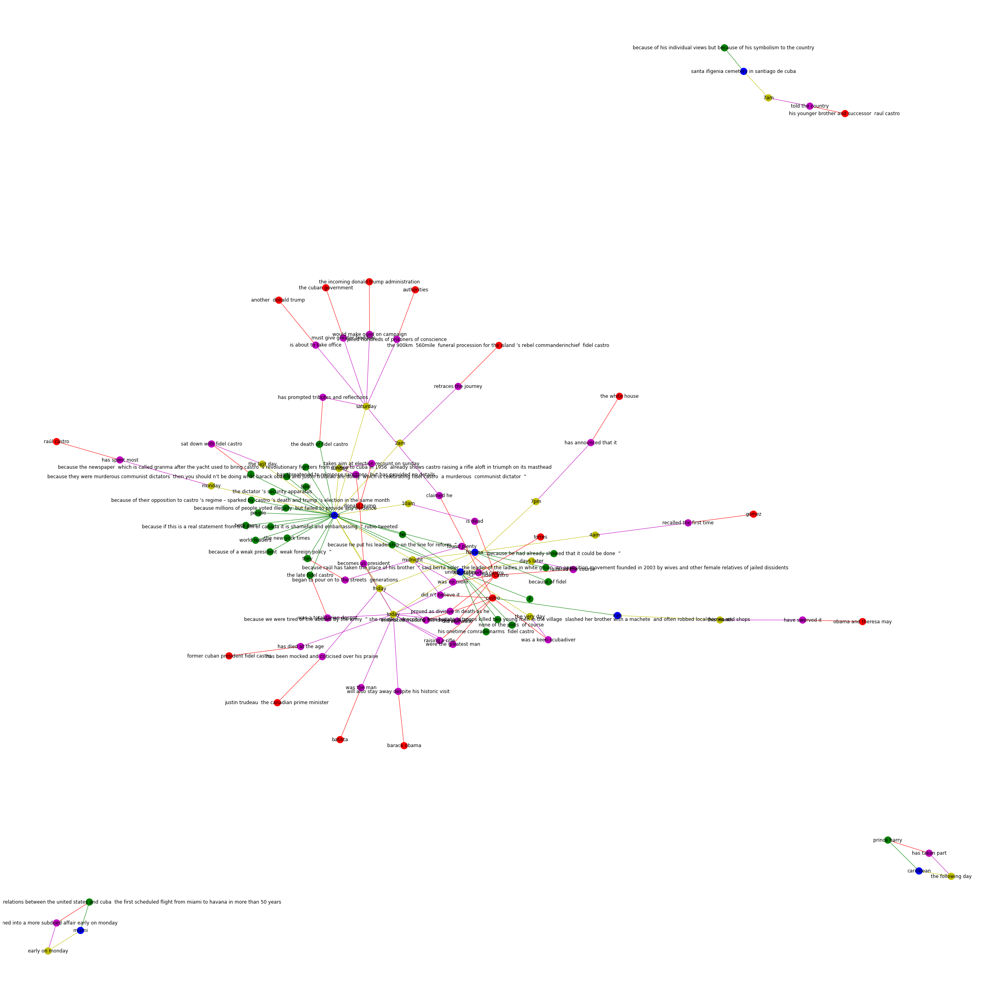

In [ ]:
# annotated flat version of chart 
# shell_layout
# spiral layout
g = nx.Graph()
for index, row in df_barc.iterrows():
  g.add_node(row['top_who_answer'], color="r")
  g.add_node(row['top_what_answer'], color="m")
  g.add_node(row['top_when_answer'], color="y")
  g.add_node(row['top_where_answer'], color="b")
  g.add_node(row['top_why_answer'], color="g")
  #g.add_node(row['top_how_answer'], color="c")
  g.add_edge(row['top_who_answer'], row['top_what_answer'], color='r')
  g.add_edge(row['top_what_answer'], row['top_when_answer'], color='m')
  g.add_edge(row['top_when_answer'], row['top_where_answer'], color='y')
  g.add_edge(row['top_where_answer'], row['top_why_answer'], color='g')
  #g.add_edge(row['top_why_answer'], row['top_how_answer'], color='b')

'''
color_map = []
for node in g:
    if node in df1["top_who_answer"]:
        color_map.append('blue')
    else: 
        color_map.append('green')      
#nx.draw(G, node_color=color_map, with_labels=True)
#plt.show()
'''
plt.figure(figsize=(35,35))

#print(edge_colors)
#print(node_colors)

pos = nx.spring_layout(g)
nx.draw(
    g,
    with_labels=True,
    edge_color=nx.get_edge_attributes(g, 'color').values(),
    node_color=nx.get_node_attributes(g, 'color').values(),
    pos = pos
  )
plt.show()

In [ ]:
# 3d Plot
g = nx.Graph()
for index, row in df_barc.iterrows():
  g.add_node(row['top_who_answer'], color=who_color, text=str(row['top_who_answer'] + "; " + row['pub_date_dto']))
  g.add_node(row['top_what_answer'], color=what_color, text=str(row['top_what_answer'] + "; " + row['pub_date_dto']))
  g.add_node(row['top_when_answer'], color=when_color, text=str(row['top_when_answer'] + "; " + row['pub_date_dto']))
  g.add_node(row['top_where_answer'], color=where_color, text=str(row['top_where_answer'] + "; " + row['pub_date_dto']))
  g.add_node(row['top_why_answer'], color=why_color, text=str(row['top_why_answer'] + "; " + row['pub_date_dto']))
  #g.add_node(row['top_how_answer'], color=how_color)
  g.add_edge(row['top_who_answer'], row['top_what_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_what_answer'], row['top_when_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_when_answer'], row['top_where_answer'])#, edge_color=row['unix_time_normalized'])
  g.add_edge(row['top_where_answer'], row['top_why_answer'])#, edge_color=row['unix_time_normalized'])
  #g.add_edge(row['top_why_answer'], row['top_how_answer'])#, edge_color=row['unix_time_normalized'])
g_positions = nx.spring_layout(g)

# print(g_positions)
print(g.edges())
edge_x = []
edge_y = []
edge_z = []
edge_color = []

for edge in g.edges():
    x0, y0 = g_positions[edge[0]]
    x1, y1 = g_positions[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)
    edge_z.append(0)
    edge_z.append(0)
    edge_z.append(None)
   # edge_color.append(convert_normalized_value_to_color(g.edges[edge]['edge_color']))


edge_trace = go.Scatter3d(
    x=edge_x,
    y=edge_y,
    z=edge_z,
    line=dict(
        width=0.5,
        # color=edge_color,
    ),
    hoverinfo='none',
    mode='lines',
)
# print(edge_color)
# edge_trace.marker.color = edge_color

# print(g.nodes())
node_x = []
node_y = []
node_z = []
node_colors = []
node_t = []
for node in g.nodes():
    # print(g_positions[node])
    x, y = g_positions[node]
    node_x.append(x)
    node_y.append(y)
    node_z.append(0)
    # node_t.append()

node_trace = go.Scatter3d(
    x=node_x,
    y=node_y,
    z=node_z,
    mode='markers',
    hoverinfo='text',
    marker=dict(
       showscale=False,
        reversescale=False,
        size=10,
        colorbar=dict(
            thickness=1,
            title='Node Connections',
            xanchor='left',
            titleside='right',
        ),
        line_width=2
    )
)


node_trace.marker.color = list(nx.get_node_attributes(g, 'color').values())
# node_trace.text = [str(x) for x in g.nodes()]
node_trace.text = list(nx.get_node_attributes(g, 'text').values())
# node_trace.text = node_t

fig = go.Figure(
    data=[edge_trace, node_trace],
    layout=go.Layout(
        title='Full Narrative Chain Network',
        titlefont_size=16,
        showlegend=False,
        hovermode='closest',
        margin=dict(b=20,l=5,r=5,t=40),
        annotations=[dict(
             text="Full Network 3D",
            showarrow=False,
            xref="paper", 
            yref="paper",
            x=0.005,
            y=-0.002
        )],
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
    )
fig.show()
#py.plot(fig,filename="network_full_3D",auto_open=False)

[('fidel castro', 'did not want'), ('fidel castro', 'is dead'), ('fidel castro', 'proved as divisive in death as he'), ('fidel castro', 'altered the course'), ('fidel castro', 'found plenty'), ('fidel castro', 'was no more'), ('did not want', 'today'), ('today', 'united states'), ('today', 'has died at the age'), ('today', 'cuba'), ('today', 'were the greatest man'), ('today', 'proved as divisive in death as he'), ('today', 'was the man'), ('today', 'raising a rifle'), ('today', 'was a totalitarian despot'), ('today', 'will also stay away despite his historic visit'), ('today', 'becomes us president'), ('today', 'has supported castro'), ('united states', 'because he put his leadership on the line for reform  ”'), ('united states', 'the very day'), ('united states', 'none of the plots  of course '), ('united states', 'days later'), ('united states', 'cuba'), ('united states', 'his onetime comradeinarms  fidel castro'), ('united states', 'midnight'), ('united states', 'he'), ('united sta

### Analysis of Full Narrative Network





In [ ]:
# Define nodes_with_m_nbrs()
def nodes_with_m_nbrs(G, m):
    """
    Returns all nodes in graph G that have m neighbors.
    """
    nodes = set()

    # Iterate over all nodes in G
    for n in G.nodes():

        # Check if the number of neighbors of n matches m
        if len(list(G.neighbors(n))) == m:

            # Add the node n to the set
            nodes.add(n)

    # Return the nodes with m neighbors
    return nodes

# Compute and print all nodes in T that have 6 neighbors
six_nbrs = nodes_with_m_nbrs(g,5)
print(six_nbrs)

set()


In [ ]:
# Compute the degree of every node: degrees
degrees = [len(list(g.neighbors(G))) for G in g.nodes()]

# Print the degrees
print(degrees)

[6, 2, 12, 12, 2, 7, 2, 2, 1, 2, 2, 7, 30, 1, 2, 1, 2, 2, 4, 2, 2, 7, 2, 2, 2, 2, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 1, 1, 2, 4, 1, 2, 1, 2, 1, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 7, 1, 1, 2, 1, 1, 2, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 3, 2, 1, 1, 2, 2, 1, 1, 2, 2, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 2, 1]


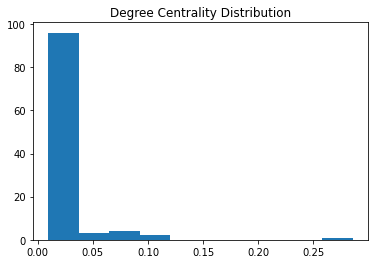

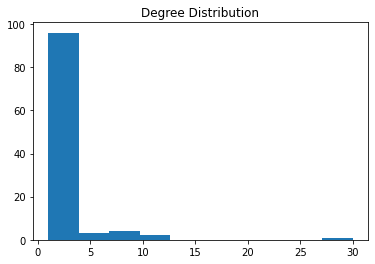

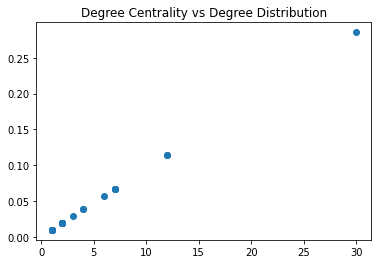

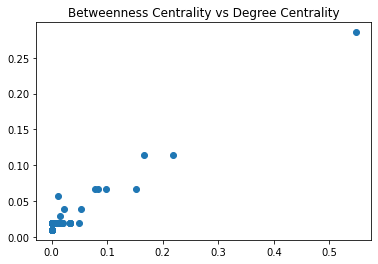

In [ ]:
# Compute the degree centrality of the Twitter network: deg_cent
deg_cent = nx.degree_centrality(g)

# Plot a histogram of the degree centrality distribution of the graph.
plt.figure()
plt.hist(list(deg_cent.values()))
plt.title("Degree Centrality Distribution")
plt.show()

# Plot a histogram of the degree distribution of the graph
plt.figure()
plt.hist(degrees)
plt.title("Degree Distribution")
plt.show()

# Plot a scatter plot of the centrality distribution and the degree distribution
plt.figure()
plt.scatter(degrees,list(deg_cent.values()))
plt.title("Degree Centrality vs Degree Distribution")
plt.show()

# Compute the betweenness centrality of G: bet_cen
bet_cen = nx.betweenness_centrality(g)

# Compute the degree centrality of G: deg_cen
deg_cen = nx.degree_centrality(g)

# Create a scatter plot of betweenness centrality and degree centrality
plt.scatter(list(bet_cen.values()), list(deg_cen.values()))
plt.title("Betweenness Centrality vs Degree Centrality")
# Display the plot
plt.show()

In [ ]:
# Define find_nodes_with_highest_deg_cent()
def find_nodes_with_highest_deg_cent(G):

    # Compute the degree centrality of G: deg_cent
    deg_cent = nx.degree_centrality(G)

    # Compute the maximum degree centrality: max_dc
    max_dc = max(list(deg_cent.values()))

    nodes = set()

    # Iterate over the degree centrality dictionary
    for k, v in deg_cent.items():

        # Check if the current value has the maximum degree centrality
        if v == max_dc:

            # Add the current node to the set of nodes
            nodes.add(k)

    return nodes

# Find the node(s) that has the highest degree centrality in T: top_dc
top_dc = find_nodes_with_highest_deg_cent(g)
print(top_dc)

# Write the assertion statement
for node in top_dc:
    assert nx.degree_centrality(g)[node] == max(nx.degree_centrality(g).values())

{'cuba'}


In [ ]:
# Define find_node_with_highest_bet_cent()
def find_node_with_highest_bet_cent(G):

    # Compute betweenness centrality: bet_cent
    bet_cent = nx.betweenness_centrality(G)

    # Compute maximum betweenness centrality: max_bc
    max_bc = max(list(bet_cent.values()))

    nodes = set()

    # Iterate over the betweenness centrality dictionary
    for k, v in bet_cent.items():

        # Check if the current value has the maximum betweenness centrality
        if v == max_bc:

            # Add the current node to the set of nodes
            nodes.add(k)

    return nodes
  
  # Use that function to find the node(s) that has the highest betweenness centrality in the network: top_bc
top_bc = find_node_with_highest_bet_cent(g)
print(top_bc)

# Write an assertion statement that checks that the node(s) is/are correctly identified.
for node in top_bc:
    assert nx.betweenness_centrality(g)[node] == max(nx.betweenness_centrality(g).values())

{'cuba'}


### Day by Day 3D graph 

In [ ]:
def make_every_day_between_min_and_max(input_df, pub_date_col):
  every_publication_date = input_df[pub_date_col].unique().tolist()
  every_publication_date_dto = [dt.datetime.strptime(publication_date, "%Y-%m-%d") for publication_date in every_publication_date]
  print(every_publication_date)
  min_pub_date_dto = min(every_publication_date_dto)
  max_pub_date_dto = max(every_publication_date_dto)

  day_delta = max_pub_date_dto - min_pub_date_dto
  ret = []
  for i in range(day_delta.days + 1):
    day = min_pub_date_dto + dt.timedelta(days=i)
    day_str = day.strftime("%Y-%m-%d")
    ret.append(day_str)

  return ret

print(make_every_day_between_min_and_max(df_barc, 'pub_date_dto'))

['2016-11-26', '2016-11-27', '2016-11-28', '2016-11-29', '2016-11-30', '2016-12-02', '2016-12-03', '2016-12-04']
['2016-11-26', '2016-11-27', '2016-11-28', '2016-11-29', '2016-11-30', '2016-12-01', '2016-12-02', '2016-12-03', '2016-12-04']


In [ ]:
g = nx.Graph()


every_date_between_list = make_every_day_between_min_and_max(df_barc, 'pub_date_dto')

for index, row in df_barc.iterrows():
  depth=every_date_between_list.index(row['pub_date_dto'])
  g.add_node((row['top_who_answer'], depth), color= who_color, depth=depth) 
  g.add_node((row['top_what_answer'], depth), color=what_color, depth=depth) 
  g.add_node((row['top_when_answer'], depth), color= when_color, depth=depth) 
  g.add_node((row['top_where_answer'], depth), color=where_color, depth=depth) 
  g.add_node((row['top_why_answer'], depth), color= why_color, depth=depth) 
  g.add_node((row['top_how_answer'], depth), color= how_color, depth=depth) 
  g.add_edge((row['top_who_answer'], depth), (row['top_what_answer'], depth), depth=depth)#, edge_color=row['unix_time_normalized'])
  g.add_edge((row['top_what_answer'], depth), (row['top_when_answer'], depth), depth=depth)#, edge_color=row['unix_time_normalized'])
  g.add_edge((row['top_when_answer'], depth), (row['top_where_answer'], depth), depth=depth)#, edge_color=row['unix_time_normalized'])
  g.add_edge((row['top_where_answer'], depth), (row['top_why_answer'], depth), depth=depth)#, edge_color=row['unix_time_normalized'])
  g.add_edge((row['top_why_answer'], depth), (row['top_how_answer'], depth), depth=depth)#, edge_color=row['unix_time_normalized'])
g_positions = nx.spiral_layout(g)

# print(g_positions)
# print(g.edges())
edge_x = []
edge_y = []
edge_z = []
edge_color = []
for edge in g.edges():
    x0, y0 = g_positions[edge[0]]
    x1, y1 = g_positions[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)
    edge_z.append(g.edges[edge]['depth'])
    edge_z.append(g.edges[edge]['depth'])
    edge_z.append(None)
   # edge_color.append(convert_normalized_value_to_color(g.edges[edge]['edge_color']))


edge_trace = go.Scatter3d(
    x=edge_x,
    y=edge_y,
    z=edge_z,
    line=dict(
        width=0.5,
        # color=edge_color,
    ),
    hoverinfo='none',
    mode='lines',
)
# print(edge_color)
# edge_trace.marker.color = edge_color

# print(g.nodes())
node_x = []
node_y = []
node_z = []
node_colors = []
node_texts = []
for node in g.nodes():
    # print(g_positions[node])
    x, y = g_positions[node]
    node_x.append(x)
    node_y.append(y)
    node_z.append(g.nodes[node]['depth'])

node_trace = go.Scatter3d(
    x=node_x,
    y=node_y,
    z=node_z,
    mode='markers',
    hoverinfo='text',
    marker=dict(
       showscale=False,
        reversescale=False,
        size=10,
        colorbar=dict(
            thickness=1,
            title='Node Connections',
            xanchor='left',
            titleside='right',
        ),
        line_width=2
    )
)


node_trace.marker.color = list(nx.get_node_attributes(g, 'color').values())
node_trace.text = [str(x) for x in g.nodes()]

fig = go.Figure(
    data=[edge_trace, node_trace],
    layout=go.Layout(
        title='<br>Network of Articles Day by Day',
        titlefont_size=16,
        showlegend=False,
        hovermode='closest',
        margin=dict(b=20,l=5,r=5,t=40),
        annotations=[dict(
            text="Day by Day Network 3D",
            showarrow=False,
            xref="paper", 
            yref="paper",
            x=0.005,
            y=-0.002
        )],
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
    )

fig.show()
#py.plot(fig,filename="network_full_daily",auto_open=False)

['2016-11-26', '2016-11-27', '2016-11-28', '2016-11-29', '2016-11-30', '2016-12-02', '2016-12-03', '2016-12-04']


# Named Entity Recognition (NER) Analysis

## NER mentions over course of narrative chain using Gantt Chart 

### Evolution of Top People NERS

In [ ]:
# gantt= df1.sort_values(by='pub_date_dto').groupby('v_hier_infomap_comm').agg({'pub_date_dto': max, 'pub_date_dto':min})



def gantt_NER(df,num):
  gantt_df = pd.DataFrame(columns=["Begin", "End"])
  # print(df1.head(1))
  for entity_name in df['entity'].unique().tolist():
    entity_df = df[df["entity"] == entity_name]
    entity_count=len(entity_df)

    every_publication_date = entity_df["pub_date_dto"].unique().tolist()
    every_publication_date_dto = [dt.datetime.strptime(publication_date, "%Y-%m-%d") for publication_date in every_publication_date]
    # print(every_publication_date)
    # if len(every_publication_date) < 2:
    #   continue
    min_pub_date_dto = min(every_publication_date_dto)
    max_pub_date_dto = max(every_publication_date_dto)
    # Push the max day up by 1, to include that day.
    max_pub_date_dto = max_pub_date_dto + dt.timedelta(days=1)

    entity_dict = {
        'Entity_Name': entity_name,
        'Begin': min_pub_date_dto.strftime("%Y-%m-%d"),
        'End': max_pub_date_dto.strftime("%Y-%m-%d"),
        'entity_count': entity_count
    }
    # print(cluster_dict)
    gantt_df = gantt_df.append(entity_dict, ignore_index=True)



  gantt_df["enity_count"] = gantt_df["entity_count"].astype(int)

  gantt_df=gantt_df[gantt_df["entity_count"]>=num]
  return gantt_df

df_people= new_df[new_df["entity_type"]=="PERSON"]
gantt_df_new=gantt_NER(df_people,15)

In [ ]:
fig = px.timeline(gantt_df_new, x_start="Begin", x_end="End", y="Entity_Name", color="entity_count", title= "Named Entity Regonition Evolution of Narrative Chain for People", color_continuous_scale=px.colors.sequential.Jet)
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
fig.show()
#py.plot(fig,filename="NER_people",auto_open=False)

### Evolution of Top Organization NER Mentions 

---



In [ ]:

df_org= new_df[new_df["entity_type"]=="ORG"]

gantt_df_new=gantt_NER(df_org,15)
fig = px.timeline(gantt_df_new, x_start="Begin", x_end="End", y="Entity_Name", color="entity_count", title= "Named Entity Regonition Evolution of Narrative Chain for Organizations", color_continuous_scale=px.colors.sequential.Jet)
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
fig.show()
#py.plot(fig,filename="NER_ORG",auto_open=False)


### Evolution of Top NORP NER Mentions 

In [ ]:
# gantt= df1.sort_values(by='pub_date_dto').groupby('v_hier_infomap_comm').agg({'pub_date_dto': max, 'pub_date_dto':min})


df_NORP= new_df[new_df["entity_type"]=="NORP"]

gantt_df_new=gantt_NER(df_NORP,6)
fig = px.timeline(gantt_df_new, x_start="Begin", x_end="End", y="Entity_Name", color="entity_count", title= "Named Entity Regonition Evolution of Narrative Chain for NORP", color_continuous_scale=px.colors.sequential.Jet)
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
fig.show()
#py.plot(fig,filename="NER_NORP",auto_open=False)



### Evolution of Top GPE NER Mentions 

In [ ]:
df_GPE= new_df[new_df["entity_type"]=="GPE"]

gantt_df_new=gantt_NER(df_GPE,50)
fig = px.timeline(gantt_df_new, x_start="Begin", x_end="End", y="Entity_Name", color="entity_count", title= "Named Entity Regonition Evolution of Narrative Chain for GPE", color_continuous_scale=px.colors.sequential.Jet)
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
fig.show()
#py.plot(fig,filename="NER_GPE",auto_open=False)




### Evolution of Top NER EVENT Mentions 

In [ ]:
df_EVENT= new_df[new_df["entity_type"]=="EVENT"]


gantt_df_new=gantt_NER(df_EVENT,1)
fig = px.timeline(gantt_df_new, x_start="Begin", x_end="End", y="Entity_Name", color="entity_count", title= "Named Entity Regonition Evolution of Narrative Chain for Event", color_continuous_scale=px.colors.sequential.Jet)
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
#fig.show()
#py.plot(fig,filename="NER_EVENT",auto_open=False)

### Evolution of Top NER Location Mentions 

In [ ]:
df_LOC= new_df[new_df["entity_type"]=="LOC"]


gantt_df_new=gantt_NER(df_LOC,1)
fig = px.timeline(gantt_df_new, x_start="Begin", x_end="End", y="Entity_Name", color="entity_count", title= "Named Entity Regonition Evolution of Narrative Chain for Locations", color_continuous_scale=px.colors.sequential.Jet)
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
fig.show()
#py.plot(fig,filename="NER_LOC",auto_open=False)

# Network Evolution of NERs 

In [ ]:
def make_figure(g):
    g_positions = nx.spring_layout(g)

    edge_x = []
    edge_y = []
    for edge in g.edges():
        x0, y0 = g_positions[edge[0]]
        x1, y1 = g_positions[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)

    edge_trace = go.Scatter(
        x=edge_x,
        y=edge_y,
        line=dict(
            width=0.5,
        ),
        hoverinfo='none',
        mode='lines',
    )

    node_x = []
    node_y = []
    node_texts = []

    for node_name in g.nodes():
        # print(g_positions[node])
        x, y = g_positions[node_name]
        node_x.append(x)
        node_y.append(y)

    node_trace = go.Scatter(
        x=node_x,
        y=node_y,
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            reversescale=True,
            colorbar=dict(
                thickness=1,
                title='Node Connections',
                xanchor='left',
                titleside='right',
            ),
            line_width=2
        )
    )

    print(edge_trace)
    print(node_trace)

    fig = go.Figure(
        data=[edge_trace, node_trace],
        layout=go.Layout(
            #title='<br>Network graph made with Python',
            #titlefont_size=16,
            showlegend=False,
            hovermode='closest',
            margin=dict(b=20,l=5,r=5,t=40),
            annotations=[dict(
                showarrow=False,
                xref="paper", 
                yref="paper",
                x=0.005,
                y=-0.002
            )],
            xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
            yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
        )
    return fig

In [ ]:
def make_figure_1(g):
  g_positions = nx.spring_layout(g)

  # print(g_positions)
  # print(g.edges())
  edge_x = []
  edge_y = []
  edge_color = []
  for edge in g.edges():
      x0, y0 = g_positions[edge[0]]
      x1, y1 = g_positions[edge[1]]
      edge_x.append(x0)
      edge_x.append(x1)
      edge_x.append(None)
      edge_y.append(y0)
      edge_y.append(y1)
      edge_y.append(None)
    # edge_color.append(convert_normalized_value_to_color(g.edges[edge]['edge_color']))


  edge_trace = go.Scatter(
      x=edge_x,
      y=edge_y,
      line=dict(
          width=0.5,
          # color=edge_color,
      ),
      hoverinfo='none',
      mode='lines',
  )
  # print(edge_color)
  # edge_trace.marker.color = edge_color

  # print(g.nodes())
  node_x = []
  node_y = []
  node_colors = []
  node_texts = []
  for node in g.nodes():
      # print(g_positions[node])
      x, y = g_positions[node]
      node_x.append(x)
      node_y.append(y)

  node_trace = go.Scatter(
      x=node_x,
      y=node_y,
      mode='markers',
      hoverinfo='text',
      marker=dict(
        showscale=False,
          reversescale=False,
          size=10,
          colorbar=dict(
              thickness=1,
              title='Node Connections',
              xanchor='left',
              titleside='right',
          ),
          line_width=2
      )
  )


  node_trace.marker.color = list(nx.get_node_attributes(g, 'color').values())
  node_trace.text = [str(x) for x in g.nodes()]

  fig = go.Figure(
      data=[edge_trace, node_trace],
      layout=go.Layout(
          title='<br>Network graph made with Python',
          titlefont_size=16,
          showlegend=False,
          hovermode='closest',
          margin=dict(b=20,l=5,r=5,t=40),
          annotations=[dict(
              showarrow=False,
              xref="paper", 
              yref="paper",
              x=0.005,
              y=-0.002
          )],
          xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
          yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
      )

  return fig

In [ ]:


print("size of df_people['entity']", len(df_people['entity']))
print("size of df_org['entity']", len(df_org['entity']))
Gs = [] 
for day in make_every_day_between_min_and_max(new_df, 'pub_date_dto'):
    # print(day)
    # Instantiate a new undirected graph: G
    G = nx.Graph()
    
    # Add in all nodes that have ever shown up to the graph
    G.add_nodes_from(df_people['entity'])
    G.add_nodes_from(df_org['entity'])
    G.add_nodes_from(df_NORP['entity'])
    G.add_nodes_from(df_GPE['entity'])
    
    # Filter the DataFrame so that there's only the given month
    df_filtered = new_df[new_df['pub_date_dto'] == day]

    edges = []
    every_entity_today = df_filtered[df_filtered["entity_type"].isin(['NORP','PERSON', "GPE", "ORG"])]
    every_entity_today = every_entity_today["entity"]

    for lidx, left in enumerate(every_entity_today):
      if lidx+1 == len(every_entity_today):
        break
      for ridx, right in enumerate(every_entity_today[lidx+1:]):
        edges.append((left, right))
    print("All the edges:", edges)

    if len(edges) < 1:
      continue
    
    # Add edges from filtered DataFrame
    G.add_edges_from(edges) 

    # Clip out every node with less than 1 connecting edge.
    G_reduced = G.copy()
    removed_nodes = [node for node,degree in dict(G_reduced.degree()).items() if degree < 1]
    G_reduced.remove_nodes_from(removed_nodes)

    fig = make_figure_1(G_reduced)
    fig.show()
    
    # Append G to the list of graphs
    Gs.append(G)

size of df_people['entity'] 1108
size of df_org['entity'] 335
['2016-11-26', '2016-11-27', '2016-11-28', '2016-11-29', '2016-11-30', '2016-12-02', '2016-12-03', '2016-12-04']


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



All the edges: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



All the edges: [('The White House', 'Fidel Castro’s'), ('The White House', 'Havana'), ('The White House', 'US'), ('The White House', 'US'), ('The White House', 'Cuba'), ('The White House', 'US'), ('The White House', 'Cuba'), ('The White House', 'Barack Obama'), ('The White House', 'Cuba'), ('The White House', 'Obama'), ('The White House', 'Republicans'), ('The White House', 'Democrats'), ('The White House', 'Castro'), ('The White House', 'The White House'), ('The White House', 'Donald Trump'), ('The White House', 'White House'), ('The White House', 'Josh Earnest'), ('The White House', 'US'), ('The White House', 'Jeffrey DeLaurentis'), ('The White House', 'Ben Rhodes'), ('The White House', 'Earnest'), ('The White House', 'Cuba'), ('The White House', 'US'), ('The White House', 'Cuba'), ('The White House', 'Castro'), ('The White House', 'Cuban'), ('The White House', 'Cuban'), ('The White House', 'The United States'), ('The White House', 'Cuba'), ('The White House', 'US'), ('The White Hous

All the edges: [('Havana', 'Fidel Castro'), ('Havana', 'Cuban'), ('Havana', 'Raul Castro'), ('Havana', 'the United States'), ('Havana', 'Venezuela'), ('Havana', 'Nicholas Maduro'), ('Havana', 'Bolivia'), ('Havana', 'Zimbabwe'), ('Havana', 'Robert Mugabe'), ('Havana', 'South Africa’s'), ('Havana', 'Jacob Zuma'), ('Havana', 'Castro'), ('Havana', 'Castro'), ('Havana', 'Castro'), ('Havana', 'Maduro'), ('Havana', 'Fidel'), ('Havana', 'Cuba'), ('Havana', 'Maduro'), ('Havana', 'Cubans'), ('Havana', 'Castro'), ('Havana', 'Armando Vasquez'), ('Havana', 'Castro'), ('Havana', 'the Sierra Maestra'), ('Havana', 'Castro'), ('Havana', 'Fidel'), ('Havana', 'Gilberto Gonzalez'), ('Havana', 'Cubans'), ('Havana', 'Sandra Calvo'), ('Havana', 'Cuban'), ('Havana', 'Patricia'), ('Havana', 'Cuba'), ('Havana', 'Raul Castro'), ('Havana', 'Castro'), ('Havana', 'Havana'), ('Havana', 'Castro'), ('Havana', 'Cubans'), ('Havana', 'Havana'), ('Havana', 'Cuba'), ('Havana', 'Raul'), ('Havana', 'Cuban'), ('Havana', 'Cast

All the edges: []
All the edges: [('Cuba', 'Fidel Castro'), ('Cuba', 'Cuba'), ('Cuba', 'Cienfuegos'), ('Cuba', 'Castro'), ('Cuba', 'Cuba'), ('Cuba', 'the Soviet Union'), ('Cuba', 'Chernobyl'), ('Cuba', 'Soviet'), ('Cuba', 'Fidel'), ('Cuba', 'Soviets'), ('Cuba', 'Cuba'), ('Cuba', 'Venezuela'), ('Cuba', 'Castro'), ('Cuba', 'Hugo Chávez'), ('Cuba', 'Cienfuegos'), ('Cuba', 'Venezuela'), ('Cuba', 'Dagmara Quirós'), ('Cuba', 'Cubans'), ('Cuba', 'Fidel'), ('Cuba', 'Quirós'), ('Cuba', 'Castro'), ('Cuba', 'María Elena Martínez'), ('Cuba', 'Cuban'), ('Cuba', 'Castro'), ('Cuba', 'US'), ('Cuba', 'Donald Trump’s'), ('Cuba', 'Barack Obama’s'), ('Cuba', 'Castro'), ('Cuba', 'Ernesto “Che” Guevara'), ('Cuba', 'Santa Clara'), ('Cuba', 'Sancti Spíritus'), ('Cuba', 'Castro'), ('Cuba', 'Castro'), ('Cuba', 'Fulgencio Batista'), ('Cuba', 'Castro'), ('Cuba', 'Cuban'), ('Cuba', 'Roberto Garit'), ('Cuba', 'Sancti Spíritus'), ('Cuba', 'Cuban'), ('Cuba', 'Castro'), ('Cuba', 'Granma'), ('Cuba', 'Castro'), ('Cuba',

All the edges: [('Fidel Castro', 'Cuban'), ('Fidel Castro', 'Miami'), ('Fidel Castro', 'Havana'), ('Fidel Castro', 'Donald Trump'), ('Fidel Castro', 'US'), ('Fidel Castro', 'Castro'), ('Fidel Castro', 'Cuba'), ('Fidel Castro', 'Miami'), ('Fidel Castro', 'Cuban Americans'), ('Fidel Castro', 'Castro'), ('Fidel Castro', 'Castro'), ('Fidel Castro', 'Trump’s'), ('Fidel Castro', 'Fidel Castro'), ('Fidel Castro', 'Florida'), ('Fidel Castro', 'Cuba'), ('Fidel Castro', 'Jorge Mas Santos'), ('Fidel Castro', 'Miami'), ('Fidel Castro', 'Cuban American National Foundation'), ('Fidel Castro', 'Cuba'), ('Fidel Castro', 'Cuban'), ('Fidel Castro', 'Cubans'), ('Fidel Castro', 'Cuba'), ('Fidel Castro', 'Miami'), ('Fidel Castro', 'Cuban Americans'), ('Fidel Castro', 'Versailles Bakery'), ('Fidel Castro', 'Little'), ('Fidel Castro', 'Havana'), ('Fidel Castro', 'Barack Obama'), ('Fidel Castro', 'Cuban'), ('Fidel Castro', 'Raúl Castro'), ('Fidel Castro', 'Cuba'), ('Fidel Castro', 'Cuban'), ('Fidel Castro', '

All the edges: [('Fidel Castro’s', 'Havana'), ('Fidel Castro’s', 'Fidelistas'), ('Fidel Castro’s', 'Putin'), ('Fidel Castro’s', 'Castro'), ('Fidel Castro’s', 'Miami'), ('Fidel Castro’s', 'Cubans'), ('Fidel Castro’s', 'Castro'), ('Fidel Castro’s', 'Nora Torres'), ('Fidel Castro’s', 'Castro'), ('Fidel Castro’s', 'Fulgencio Batista'), ('Fidel Castro’s', 'Santiago'), ('Fidel Castro’s', 'the Sierra Maestra'), ('Fidel Castro’s', 'Batista’s'), ('Fidel Castro’s', 'Contramaestre'), ('Fidel Castro’s', 'Cuban'), ('Fidel Castro’s', 'the Soviet Union'), ('Fidel Castro’s', 'Fidel’s'), ('Fidel Castro’s', 'Without Castro'), ('Fidel Castro’s', 'Castro'), ('Fidel Castro’s', 'Ernesto Pérez Torres'), ('Fidel Castro’s', 'Havana'), ('Fidel Castro’s', 'the Soviet Union'), ('Fidel Castro’s', 'Communist'), ('Fidel Castro’s', 'Castro'), ('Fidel Castro’s', 'Soviet'), ('Fidel Castro’s', 'Cubans'), ('Fidel Castro’s', 'Ernesto'), ('Fidel Castro’s', 'US'), ('Fidel Castro’s', 'Cuba'), ('Fidel Castro’s', 'Elizabeth'),

In [ ]:
# Instantiate a list of graphs that show edges added
added = []
# Instantiate a list of graphs that show edges removed 
removed = []
# Here's the fractional change over time
fractional_changes = []
window = 1  
i = 0      

for i in range(len(Gs) - window):
    g1 = Gs[i]
    g2 = Gs[i + window]
        
    # Compute graph difference 
    added.append(nx.difference(g2, g1))   
    removed.append(nx.difference(g1, g2))
    
    # Compute change in graph size over time
    fractional_changes.append((len(g2.edges()) - len(g1.edges())) / len(g1.edges()))
    
# Print the fractional change
print(fractional_changes)


[0.06819266956888077, -0.5792601162148661, -0.7314710661167354, -0.8333721200837794, 0.2751396648044693, -0.37130339539978097, -0.17770034843205576]


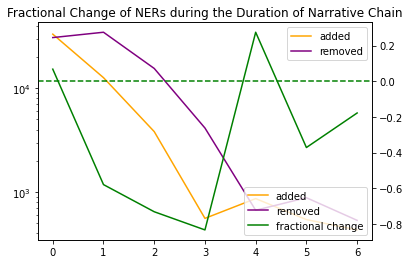

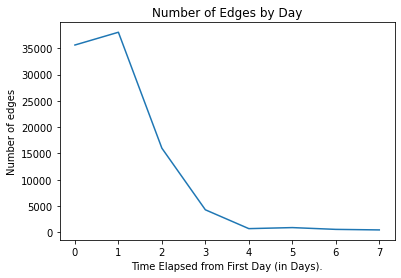

In [ ]:


fig = plt.figure()
ax1 = fig.add_subplot(111)

# Plot the number of edges added over time
edges_added = [len(g.edges()) for g in added]
plot1 = ax1.plot(edges_added, label='added', color='orange')

# Plot the number of edges removed over time
edges_removed = [len(g.edges()) for g in removed]
plot2 = ax1.plot(edges_removed, label='removed', color='purple')

# Set yscale to logarithmic scale
ax1.set_yscale('log')  
ax1.legend()

# 2nd axes shares x-axis with 1st axes object
ax2 = ax1.twinx()

# Plot the fractional changes over time
plot3 = ax2.plot(fractional_changes, label='fractional change', color='green')

# Here, we create a single legend for both plots
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc=0)
plt.axhline(0, color='green', linestyle='--')
plt.title("Fractional Change of NERs during the Duration of Narrative Chain")
plt.show()


fig = plt.figure()

# Create a list of the number of edges per day
edge_sizes = [len(g.edges()) for g in Gs]
#print(edge_sizes)
# Plot edge sizes over time
plt.plot(edge_sizes)
plt.xlabel('Time Elapsed from First Day (in Days).') 
plt.ylabel('Number of edges')     
plt.title("Number of Edges by Day")                      
plt.show() 

